<a href="https://colab.research.google.com/github/AhmedHossam61/AhmedHossam61/blob/main/Test_ECG_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kaggle

In [2]:
from google.colab import files
files.upload()

Saving claude2_ecg_detection_model.keras to claude2_ecg_detection_model.keras


{'claude2_ecg_detection_model.keras': b'PK\x03\x04\x14\x00\x00\x00\x00\x00\x00\x00!\x00\xc5]\xa4\x15?\x00\x00\x00?\x00\x00\x00\r\x00\x00\x00metadata.json{"keras_version": "3.8.0", "date_saved": "2025-03-12@22:45:08"}PK\x03\x04\x14\x00\x00\x00\x00\x00\x00\x00!\x00\xd0\x9be\xc5\x9f\x89\x00\x00\x9f\x89\x00\x00\x0b\x00\x00\x00config.json{"module": "keras.src.models.functional", "class_name": "Functional", "config": {"name": "functional", "trainable": true, "layers": [{"module": "keras.layers", "class_name": "InputLayer", "config": {"batch_shape": [null, 187, 1], "dtype": "float32", "sparse": false, "name": "input_layer"}, "registered_name": null, "name": "input_layer", "inbound_nodes": []}, {"module": "keras.layers", "class_name": "Conv1D", "config": {"name": "conv1d", "trainable": true, "dtype": {"module": "keras", "class_name": "DTypePolicy", "config": {"name": "float32"}, "registered_name": null}, "filters": 64, "kernel_size": [7], "strides": [1], "padding": "same", "data_format": "chan

In [3]:
!mkdir ~/.kaggle


In [4]:
!cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


In [5]:
!chmod 600 ~/.kaggle/kaggle.json

chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [6]:
!kaggle datasets list

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 4, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.11/dist-packages/kaggle/__init__.py", line 6, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 433, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method. See setup instructions at https://github.com/Kaggle/kaggle-api/


In [7]:
# prompt: generate a code to download a kaggle dataset called "ECG Heartbeat Categorization Dataset"

! kaggle datasets download shayanfazeli/heartbeat


Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 10, in <module>
    sys.exit(main())
             ^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/cli.py", line 68, in main
    out = args.func(**command_args)
          ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 1734, in dataset_download_cli
    with self.build_kaggle_client() as kaggle:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 688, in build_kaggle_client
    username=self.config_values['username'],
             ~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^
KeyError: 'username'


In [8]:
!unzip heartbeat.zip

unzip:  cannot find or open heartbeat.zip, heartbeat.zip.zip or heartbeat.zip.ZIP.


In [10]:
# X1 = [1.00000,0.93246,0.73921,0.57223,0.36585,0.17448,0.06191,0.02064,0.02814,
#     0.03377,0.08443,0.11069,0.13696,0.15385,0.17073,0.17261,0.17824,0.17261,
#     0.17073,0.16510,0.17073,0.16135,0.16135,0.15009,0.15572,0.14822,0.15385,
#     0.14822,0.16323,0.16323,0.18386,0.18762,0.21576,0.23077,0.24765,0.25891,
#     0.27955,0.28143,0.30769,0.31707,0.33959,0.34146,0.36023,0.35835,0.37336,
#     0.37148,0.37899,0.37336,0.38086,0.37148,0.37711,0.37523,0.37523,0.36210,
#     0.36773,0.36961,0.37711,0.36585,0.36210,0.34709,0.35272,0.35084,0.34897,
#     0.30957,0.28518,0.25328,0.24578,0.24015,0.24203,0.24015,0.24390,0.24390,
#     0.24765,0.24390,0.26079,0.25891,0.26454,0.26642,0.27580,0.26642,0.27392,
#     0.26454,0.27392,0.25704,0.25328,0.34146,0.50094,0.61538,0.78424,0.93621,
#     0.99250,0.93246,0.72233,0.51032,0.26829,0.09006,0.01501,0.00000,0.01876,
#     0.03189,0.08630,0.10694,0.15009,0.16510,0.17261,0.17261,0.17261,0.15947,
#     0.00000,0.00000 ,1.00000,0.79197,0.16058,0.00365,0.08029,0.10949,0.08394,0.17153,0.18613,0.16788,
#     0.16423,0.20073,0.27737,0.30657,0.28467,0.27737,0.29927,0.29562,0.28102,
#     0.30292,0.31752,0.30657,0.31022,0.29197,0.32117,0.32482,0.32117,0.35766,
#     0.36861,0.36861,0.38686,0.44526,0.48540,0.46715,0.47810,0.52555,0.54015,
#     0.54745,0.52555,0.48905,0.47080,0.41971,0.37591,0.35401,0.32847,0.29562,
#     0.26277,0.25547,0.27007,0.25182,0.25547,0.25182,0.26277,0.26277,0.23358,
#     0.25182,0.26642,0.25182,0.24818,0.25547,0.24453,0.24818,0.25182,0.25182,
#     0.27737,0.26277,0.26277,0.28467,0.32117,0.26642,0.24453,0.24088,0.24088,
#     0.25547,0.25912,0.29562,0.27007,0.25547,0.28467,0.24088,0.24818,0.28467,
#     0.27007,0.25547,0.27372,0.27372,0.28102,0.31022,0.34672,0.40876,0.56934,
#     0.80292,0.79562,0.28102,0.00000,0.02555,0.09854,0.09124,0.08029,0.17518,
#     0.19343,0.16423,0.16058,0.19708,0.25547,0.25912,0.26642,0.28832,0.26277,
#     0.00000,0.00000 , 1.00000,0.79401,0.35768,
#  0.22659,0.18727,0.17041,0.16105,0.14607,0.14045,0.12921,0.14232,0.13858,
#  0.14607,0.14045,0.15169,0.14419,0.15543,0.14794,0.15169,0.16105,0.15730,
#  0.16292,0.16854,0.15918,0.17603,0.17228,0.17790,0.18165,0.19101,0.19101,
#  0.20599,0.19101,0.19663,0.18727,0.17978,0.17228,0.17416,0.16854,0.17978,
#  0.17041,0.17416,0.18165,0.18165,0.18539,0.18352,0.18165,0.18165,0.18727,
#  0.19850,0.20974,0.26404,0.33146,0.43633,0.53933,0.67978,0.77903,0.86330,
#  0.85206,0.74906,0.67790,0.60674,0.55805,0.53745,0.44757,0.29401,0.11985,
#  0.07116,0.04682,0.03371,0.02247,0.01498,0.00000,0.00000,0.00000,0.00000,
#  0.00000,0.00000,0.00000,
#      1.00000,0.48606,0.53386,0.56574,
#  0.56972,0.54980,0.54980,0.52191,0.43426,0.29482,0.13546,0.01594,0.05578,
#  0.02789,0.00000,0.03187,0.05578,0.07968,0.07570,0.07171,0.06773,0.10757,
#  0.09562,0.11155,0.09960,0.10359,0.07171,0.05976,0.05179,0.03984,0.01594,
#  0.02390,0.01195,0.01594,0.00398,0.01992,0.02789,0.05578,0.07968,0.10757,
#  0.13147,0.16733,0.19124,0.22709,0.24303,0.26693,0.27490,0.29084,0.27888,
#  0.27888,0.26295,0.25896,0.23506,0.23506,0.22709,0.21514,0.19920,0.20319,
#  0.19124,0.19124,0.19124,0.20717,0.18725,0.18327,0.17928,0.18327,0.17928,
#  0.19522,0.18327,0.18725,0.16733,0.16733,0.16335,0.17131,0.15936,0.17131,
#  0.14343,0.15936,0.13944,0.15936,0.14343,0.15139,0.13546,0.14741,0.13546,
#  0.15139,0.13546,0.14343,0.12749,0.14741,0.13944,0.14741,0.13944,0.14741,
#  0.13944,0.14343,0.15139,0.16335,0.17131,0.24701,0.70518,0.84861,0.47809,
#  0.52191,0.54183,0.55378,0.54183,0.54183,0.49801,0.37052,0.24303,0.08765,
#  0.11155,0.10757,0.06375,0.06773,0.09960,0.11155,0.09960,0.09163,0.06773,
#  0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000]

In [26]:
X = [
    596, 589, 595, 601, 596, 578, 576, 572, 560, 543, 547, 546, 535, 525, 534, 535,
    528, 526, 536, 536, 526, 526, 535, 536, 525, 532, 542, 541, 529, 537, 545, 541,
    532, 542, 546, 538, 531, 542, 546, 535, 532, 541, 542, 532, 533, 543, 546, 540,
    546, 558, 559, 554, 571, 585, 585, 573, 580, 576, 558, 542, 543, 543, 533, 528,
    540, 541, 530, 532, 541, 540, 526, 520, 493, 457, 459, 558, 730, 876, 974, 1006,
    787, 557, 438, 412, 423, 435, 458, 485, 499, 498, 507, 516, 516, 508, 521, 528, 524, 516, 528, 534, 528,
    524, 537, 541, 533, 532, 544, 547, 537, 542, 554, 554, 545, 554, 566, 567, 560, 576, 585, 584, 580, 596,
    603, 598, 597, 609, 609, 594, 584, 586, 578, 556, 553, 555, 550, 536, 541, 546, 543, 534, 544, 547, 541,
    533, 545, 549, 542, 540, 552, 554, 542, 541, 550, 552, 540, 542, 554, 553, 541, 546, 553, 548, 538, 549,
    554, 547, 543, 557, 561, 556, 558, 576, 586, 584, 586, 592, 585, 568, 562, 561, 549, 533, 540, 545, 541,
    532, 542, 546, 540, 534, 546, 537, 497, 461, 471, 548, 692, 854, 989, 1024, 834, 603, 468, 412, 410, 447
    , 470, 481, 495, 514, 521, 512, 509, 523, 525, 517, 521, 533, 535, 524, 530, 541, 540, 530, 541, 547, 545,
    540, 553, 558, 553, 552, 562, 568, 561, 562, 579, 585, 578, 585, 598, 601, 593, 605, 615, 610, 597, 601, 600,
    586, 568, 570, 567, 552, 541, 549, 550, 541, 541, 552, 549, 536, 541, 549, 547, 535, 543, 552, 547, 537, 549,
    554, 547, 541, 553, 555, 545, 542, 553, 554, 543, 542, 552, 552, 540, 543, 552, 548, 536, 546, 555, 555, 549,
    562, 572, 570, 576, 594, 596, 585, 577, 581, 571, 553, 545, 552, 552, 537, 541, 550, 549, 537, 545, 552, 545,
    522, 497, 470, 476, 568, 747, 905, 1016, 1024, 766, 547, 432, 414, 440, 459, 469, 497, 518, 516, 512, 523, 528,
    521, 521, 534, 536, 525, 533, 545, 545, 533, 542, 552, 550, 541, 552, 560, 555, 547, 559, 568, 562, 560, 576,
    580, 574, 579, 594, 597, 589, 597, 610, 613, 600, 608, 610, 601, 581, 582, 577, 561, 547, 554, 554, 542, 535,
    546, 546, 534, 535, 546, 547, 536, 543, 552, 550, 541, 549, 556, 553, 541, 549, 554, 550, 542, 553, 555, 545,
    542, 552, 552, 541, 542, 552, 550, 537, 542, 549, 546, 534, 542, 549, 543, 534, 547, 556, 555, 553, 568, 577,
    580, 582, 594, 590, 572, 562, 562, 555, 536, 537, 545, 542, 530, 538, 544, 537, 528, 540, 541, 512, 468, 460,
    512, 638, 804, 961, 1024, 944, 690, 513, 429, 405, 440, 469, 484, 493, 511, 517, 511, 509, 522, 524, 516, 514,
    526, 530, 522, 526, 540, 540, 528, 536, 545, 545, 537, 550, 556, 553, 546, 560, 568, 560, 559, 574, 580, 572,
    577, 589, 594, 588, 594, 605, 603, 590, 594, 594, 581, 562, 566, 561, 549, 536, 543, 543, 533, 526, 537, 540,
    528, 526, 540, 541, 532, 535, 543, 542, 532, 540, 547, 542, 534, 543, 547, 541, 533, 544, 547, 537, 534, 545,
    546, 535, 534, 542, 541, 526, 533, 542, 541, 529, 536, 543, 540, 528, 537, 543, 536, 529, 541, 546, 542, 540,
    554, 555, 553, 562, 579, 579, 561, 559, 558, 550, 533, 533, 533, 526, 516, 525, 530, 523, 516, 526, 530, 508,
    471, 449, 462, 547, 714, 880, 1005, 1016, 760, 542, 424, 387, 414, 445, 454, 470, 489, 494, 484, 488, 498, 499,
    488, 497, 505, 502, 494, 505, 512, 509, 505, 514, 519, 512, 509, 523, 526, 519, 521, 533, 535, 528, 535, 550, 553,
    545, 558, 570, 569, 566, 580, 586, 582, 576, 582, 579, 561, 552, 553, 545, 528, 524, 528, 524, 509, 512, 522, 522,
    508, 518, 525, 522, 512, 522, 526, 521, 514, 525, 530, 522, 521, 533, 534, 522, 523, 532, 531, 519, 524, 533, 530,
    518, 526, 534, 530, 519, 526, 532, 524, 521, 533, 535, 525, 522, 535, 537, 532, 536, 549, 552, 542, 557, 576, 578,
    568, 570, 568, 555, 540, 542, 541, 532, 525, 537, 542, 534, 531, 540, 541, 529, 523, 502, 469, 457, 531, 686, 842,
    952, 1013, 846, 602, 454, 412, 413, 427, 447, 476, 496, 496, 502, 512, 513, 504, 513, 523, 522, 513, 524, 532, 526,
    523, 535, 540, 534, 533, 543, 546, 537, 542, 554, 554, 545, 552, 562, 567, 561, 576, 585, 586, 581, 597, 607, 604,
    598, 610, 614, 603, 593, 595, 586, 567, 558, 561, 557, 542, 545, 552, 547, 537, 546, 552, 547, 538, 549, 553, 547,
    543, 555, 558, 550, 546, 556, 556, 546, 549, 558, 556, 546, 550, 558, 556, 546, 554, 560, 555, 545, 555, 560, 553,
    547, 559, 562, 556, 559, 574, 582, 582, 591, 601, 596, 584, 579, 574, 560, 542, 546, 552, 546, 537, 547, 552, 543,
    537, 550, 550, 519, 481, 471, 508, 621, 795, 941, 1024, 931, 708, 523, 434, 408, 440, 466, 475, 489, 518, 524, 516,
    518, 529, 533, 524, 531, 541, 541, 532, 541, 549, 546, 537, 548, 555, 552, 545, 556, 561, 555, 554, 568, 572, 566,
    568, 581, 585, 577, 585, 597, 598, 592, 606, 615, 613, 601, 608, 608, 595, 580, 581, 574, 557, 549, 556, 556, 545,
    542, 552, 552, 541, 543, 552, 552, 541, 547, 555, 550, 542, 553, 558, 552, 545, 555, 557, 547, 545, 556, 558, 547,
    547, 558, 556, 545, 552, 559, 556, 545, 552, 558, 554, 545, 559, 567, 560, 560, 576, 586, 585, 586, 596, 592, 576,
    568, 567, 556, 538, 543, 552, 547, 536, 546, 552, 545, 536, 546, 540, 500, 462, 480, 568, 721, 879, 1014, 1024, 780,
    561, 452, 413, 423, 458, 478, 487, 497, 514, 519, 511, 513, 525, 526, 516, 521, 532, 532, 521, 532, 541, 537, 530,
    541, 547, 542, 535, 547, 553, 547, 546, 559, 564, 556, 560, 572, 578, 572, 582, 594, 595, 586, 597, 608, 601, 589,
    595, 592, 576, 560, 566, 559, 544, 537, 545, 545, 537, 540, 547, 545, 534, 541, 549, 545, 535, 543, 549, 545, 536,
    548, 554, 546, 542, 553, 555, 544, 542, 554, 555, 542, 543, 553, 552, 541, 545, 553, 552, 540, 547, 554, 547, 537,
    550, 556, 554, 552, 562, 570, 567, 574, 594, 598, 585, 581, 585, 576, 555, 553, 554, 547, 536, 546, 552, 546, 537,
    546, 549, 541, 523, 500, 470, 474, 570, 748, 907, 1021, 1024, 775, 548, 436, 422, 445, 457, 470, 499, 513, 508,
    512, 522, 522, 513, 521, 532, 528, 519, 530, 537, 535, 528, 541, 545, 540, 535, 550, 554, 546, 545, 556, 560, 552,
    556, 569, 571, 565, 574, 586, 586, 581, 594, 601, 597, 590, 600, 602, 590, 576, 577, 570, 552, 542, 546, 543, 530,
    530, 537, 536, 525, 533, 540, 536, 526, 536, 543, 538, 532, 542, 545, 537, 532, 543, 546, 535, 534, 545, 545, 534,
    535, 542, 542, 531, 536, 542, 537, 528, 536, 542, 535, 528, 537, 541, 532, 526, 540, 541, 528, 528, 542, 546, 538,
    545, 558, 560, 559, 577, 585, 579, 562, 566, 559, 546, 533, 536, 535, 528, 522, 533, 535, 524, 524, 535, 533, 502,
    469, 451, 484, 594, 772, 934, 1024, 992, 744, 533, 422, 394, 429, 456, 463, 481, 499, 505, 494, 499, 508, 507, 498,
    508, 516, 513, 506, 517, 523, 519, 514, 525, 528, 521, 518, 526, 530, 522, 525, 537, 541, 532, 541, 553, 555, 549,
    559, 568, 567, 561, 576, 582, 577, 570, 579, 574, 556, 543, 545, 537, 521, 518, 524, 521, 507, 509, 516, 513, 505,
    514, 522, 517, 509, 522, 526, 518, 512, 523, 526, 519, 519, 530, 529, 519, 522, 529, 528, 517, 523, 529, 525, 514,
    525, 530, 522, 513, 523, 528, 522, 517, 528, 532, 522, 522, 533, 534, 523, 525, 535, 534, 523, 531, 541, 543, 535,
    546, 553, 555, 558, 576, 580, 567, 556, 559, 554, 536, 528, 534, 534, 522, 525, 535, 535]

In [12]:
# import numpy as np
# from scipy.signal import find_peaks, butter, filtfilt

# def preprocess_ecg_batch_for_prediction(raw_signals, sample_rate=125, output_length=187):
#     """
#     Preprocess multiple raw ECG signals from a sensor to match the format expected by the CNN model.

#     Parameters:
#     raw_signals (array): Array of raw ECG signals, shape (n_samples, signal_length)
#     sample_rate (int): Sampling rate of the ECG signals in Hz
#     output_length (int): Required length of the processed signals for the CNN model

#     Returns:
#     processed_signals (array): Processed signals ready for CNN prediction, shape (n_samples, output_length, 1)
#     """
#     n_samples = len(raw_signals)
#     processed_signals = np.zeros((n_samples, output_length, 1))

#     for i, raw_signal in enumerate(raw_signals):
#         # Apply bandpass filter to remove noise (0.5-40Hz is typical for ECG)
#         nyquist = 0.5 * sample_rate
#         low = 0.5 / nyquist
#         high = 40.0 / nyquist
#         b, a = butter(2, [low, high], btype='band')
#         filtered_signal = filtfilt(b, a, raw_signal)

#         # Normalize the signal
#         signal_mean = np.mean(filtered_signal)
#         signal_std = np.std(filtered_signal)
#         normalized_signal = (filtered_signal - signal_mean) / (signal_std + 1e-10)

#         # Find R peaks (the prominent peaks in ECG)
#         peaks, _ = find_peaks(normalized_signal, height=0.5, distance=int(sample_rate * 0.5))

#         # Initialize the processed signal with zeros
#         processed_signal = np.zeros(output_length)

#         if len(peaks) >= 2:
#             # Get the first two R peaks
#             r1, r2 = peaks[0], peaks[1]

#             # Calculate beat length
#             beat_length = r2 - r1

#             # Calculate half beat before first R peak
#             half_beat = beat_length // 2
#             start_idx = max(0, r1 - half_beat)

#             # Extract segment (half beat + full beat)
#             end_idx = min(len(normalized_signal), start_idx + beat_length + half_beat)
#             segment = normalized_signal[start_idx:end_idx]

#             # Place segment at the beginning of the output array
#             if len(segment) <= output_length:
#                 processed_signal[:len(segment)] = segment
#             else:
#                 processed_signal = segment[:output_length]

#         elif len(peaks) == 1:
#             # If only one peak is found, use an estimated beat length
#             r1 = peaks[0]
#             estimated_beat_length = int(sample_rate * 0.7)  # ~0.7 seconds, typical for heart beat

#             # Calculate half beat before R peak
#             half_beat = estimated_beat_length // 2
#             start_idx = max(0, r1 - half_beat)

#             # Extract segment
#             end_idx = min(len(normalized_signal), start_idx + estimated_beat_length + half_beat)
#             segment = normalized_signal[start_idx:end_idx]

#             # Place segment at the beginning of the output array
#             if len(segment) <= output_length:
#                 processed_signal[:len(segment)] = segment
#             else:
#                 processed_signal = segment[:output_length]

#         else:
#             # If no peaks found, use a segment from the beginning
#             segment = normalized_signal[:min(output_length, len(normalized_signal))]
#             processed_signal[:len(segment)] = segment

#         # Add to batch
#         processed_signals[i, :, 0] = processed_signal

#     return processed_signals

# def predict_arrhythmia_batch(raw_signals, model, class_names=None):
#     """
#     Process multiple raw ECG signals and predict the arrhythmia class for each.

#     Parameters:
#     raw_signals (array): Array of raw ECG signals
#     model: Loaded Keras CNN model
#     class_names (list): Names of the arrhythmia classes

#     Returns:
#     predicted_classes (array): Predicted class indices
#     class_names (array): Names of the predicted classes
#     confidences (array): Confidence scores for the predictions
#     """
#     if class_names is None:
#         class_names = ['Normal', 'Supraventricular', 'Ventricular', 'Fusion', 'Unknown']

#     # Preprocess the signals
#     processed_signals = preprocess_ecg_batch_for_prediction(raw_signals)

#     # Make predictions
#     predictions = model.predict(processed_signals)
#     predicted_classes = np.argmax(predictions, axis=1)
#     confidences = np.max(predictions, axis=1)

#     # Get class names
#     predicted_class_names = [class_names[idx] for idx in predicted_classes]

#     return predicted_classes, predicted_class_names, confidences

# Choice 1 for function

In [36]:

def preprocess_ecg_batch_for_prediction(raw_signals, sample_rate=125, output_length=187):
    """
    Preprocess multiple raw ECG signals for prediction.
    """
    # Convert to numpy array if not already
    raw_signals = np.array(raw_signals)

    # Check if input is 1D, and reshape to 2D if needed
    if raw_signals.ndim == 1:
        raw_signals = np.array([raw_signals])

    n_samples = len(raw_signals)
    processed_signals = np.zeros((n_samples, output_length, 1))

    for i, raw_signal in enumerate(raw_signals):
        # Skip filtering for very short signals or if filtering fails
        try:
            # Apply bandpass filter
            nyquist = 0.5 * sample_rate
            low = 0.5 / nyquist
            high = 40.0 / nyquist
            b, a = butter(2, [low, high], btype='band')

            # Check if signal is long enough for filtfilt (needs length > 3 * (max(len(a), len(b)) - 1))
            min_length = 3 * (max(len(a), len(b)) - 1)
            if len(raw_signal) > min_length:
                filtered_signal = filtfilt(b, a, raw_signal)
            else:
                filtered_signal = raw_signal  # Use raw signal if too short
        except Exception as e:
            print(f"Filtering failed for signal {i}: {e}")
            filtered_signal = raw_signal

        # Normalize the signal
        signal_mean = np.mean(filtered_signal)
        signal_std = np.std(filtered_signal)
        if signal_std > 1e-10:  # Avoid division by zero
            normalized_signal = (filtered_signal - signal_mean) / signal_std
        else:
            normalized_signal = filtered_signal - signal_mean

        # Rest of your code remains the same...
        # Find R peaks (the prominent peaks in ECG)
        peaks, _ = find_peaks(normalized_signal, height=0.5, distance=int(sample_rate * 0.5))

        # Initialize the processed signal with zeros
        processed_signal = np.zeros(output_length)

        if len(peaks) >= 2:
            # Get the first two R peaks
            r1, r2 = peaks[0], peaks[1]

            # Calculate beat length
            beat_length = r2 - r1

            # Calculate half beat before first R peak
            half_beat = beat_length // 2
            start_idx = max(0, r1 - half_beat)

            # Extract segment (half beat + full beat)
            end_idx = min(len(normalized_signal), start_idx + beat_length + half_beat)
            segment = normalized_signal[start_idx:end_idx]

            # Place segment at the beginning of the output array
            if len(segment) <= output_length:
                processed_signal[:len(segment)] = segment
            else:
                processed_signal = segment[:output_length]

        elif len(peaks) == 1:
            # If only one peak is found, use an estimated beat length
            r1 = peaks[0]
            estimated_beat_length = int(sample_rate * 0.7)  # ~0.7 seconds, typical for heart beat

            # Calculate half beat before R peak
            half_beat = estimated_beat_length // 2
            start_idx = max(0, r1 - half_beat)

            # Extract segment
            end_idx = min(len(normalized_signal), start_idx + estimated_beat_length + half_beat)
            segment = normalized_signal[start_idx:end_idx]

            # Place segment at the beginning of the output array
            if len(segment) <= output_length:
                processed_signal[:len(segment)] = segment
            else:
                processed_signal = segment[:output_length]

        else:
            # If no peaks found, use a segment from the beginning
            segment = normalized_signal[:min(output_length, len(normalized_signal))]
            processed_signal[:len(segment)] = segment

        # Add to batch
        processed_signals[i, :, 0] = processed_signal

    return processed_signals

def predict_arrhythmia_batch(raw_signals, model, class_names=None):
    """
    Process multiple raw ECG signals and predict the arrhythmia class for each.

    Parameters:
    raw_signals (array): Array of raw ECG signals
    model: Loaded Keras CNN model
    class_names (list): Names of the arrhythmia classes

    Returns:
    predicted_classes (array): Predicted class indices
    class_names (array): Names of the predicted classes
    confidences (array): Confidence scores for the predictions
    """
    if class_names is None:
        class_names = ['Normal', 'Supraventricular', 'Ventricular', 'Fusion', 'Unknown']

    # Preprocess the signals
    processed_signals = preprocess_ecg_batch_for_prediction(raw_signals)

    # Make predictions
    predictions = model.predict(processed_signals)
    predicted_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)

    # Get class names
    predicted_class_names = [class_names[idx] for idx in predicted_classes]

    return predicted_classes, predicted_class_names, confidences

# Choice 2 for function

In [40]:
def preprocess_ecg_for_prediction(raw_signal, sample_rate=125, output_length=187):
    """
    Preprocess a raw ECG signal to extract a single beat centered in the window
    with the format shown in the reference image.
    """
    # Apply bandpass filter if signal is long enough
    try:
        nyquist = 0.5 * sample_rate
        low = 0.5 / nyquist
        high = 40.0 / nyquist
        b, a = butter(2, [low, high], btype='band')
        if len(raw_signal) > 6:  # Minimum length for filtfilt
            filtered_signal = filtfilt(b, a, raw_signal)
        else:
            filtered_signal = raw_signal
    except:
        filtered_signal = raw_signal

    # Normalize the signal to range 0-1
    min_val = np.min(filtered_signal)
    max_val = np.max(filtered_signal)
    if max_val > min_val:
        normalized_signal = (filtered_signal - min_val) / (max_val - min_val)
    else:
        normalized_signal = np.zeros_like(filtered_signal)

    # Find R peaks
    peaks, _ = find_peaks(normalized_signal, height=0.5, distance=int(sample_rate * 0.5))

    # Initialize output array with zeros
    processed_signal = np.zeros(output_length)

    if len(peaks) > 0:
        # Choose a peak (preferably not the first or last to have complete beat)
        peak_idx = len(peaks) // 2 if len(peaks) > 2 else 0
        r_peak = peaks[peak_idx]

        # Determine window around the peak
        # Based on your image, R peak appears around index 115-120
        target_peak_position = 115

        # Calculate start index to position R peak at target position
        start_idx = r_peak - target_peak_position

        # If start_idx is negative, we need to pad the beginning
        padding_needed = max(0, -start_idx)
        start_idx = max(0, start_idx)

        # Extract segment
        end_idx = min(len(normalized_signal), start_idx + output_length - padding_needed)
        segment = normalized_signal[start_idx:end_idx]

        # Place segment in output array with appropriate padding
        if padding_needed > 0:
            processed_signal[padding_needed:padding_needed+len(segment)] = segment
        else:
            processed_signal[:len(segment)] = segment

    return processed_signal

def preprocess_ecg_batch_for_prediction(raw_signals, sample_rate=125, output_length=187):
    """
    Preprocess multiple raw ECG signals using the method above.
    """
    # Convert to numpy array if not already
    raw_signals = np.array(raw_signals)

    # Check if input is 1D, and reshape to 2D if needed
    if raw_signals.ndim == 1:
        raw_signals = np.array([raw_signals])

    n_samples = len(raw_signals)
    processed_signals = np.zeros((n_samples, output_length, 1))

    for i, raw_signal in enumerate(raw_signals):
        processed_signal = preprocess_ecg_for_prediction(raw_signal, sample_rate, output_length)
        processed_signals[i, :, 0] = processed_signal

    return processed_signals

# Running

In [41]:
import numpy as np
from tensorflow.keras.models import load_model
from scipy.signal import find_peaks, butter, filtfilt


from tensorflow.keras.models import load_model
model = load_model('claude2_ecg_detection_model.keras')
# Use the X variable that contains your ECG data
# First, we need to format it appropriately since it looks like it has 3 signals concatenated
signal_length = 187  # Based on the plot and your comment
signals = []

# Split the X array into 3 separate signals (assuming they are contiguous)
for i in range(0, len(X), signal_length):
    if i + signal_length <= len(X):
        signals.append(X[i:i+signal_length])
    else:
        # Handle the last segment if it's not complete
        last_signal = X[i:]
        # Pad with zeros if needed
        if len(last_signal) < signal_length:
            last_signal = np.pad(last_signal, (0, signal_length - len(last_signal)))
        signals.append(last_signal)

# Convert to numpy array
raw_ecg_data = np.array(signals)

# Now we can proceed with prediction
class_indices, class_names, confidences = predict_arrhythmia_batch(raw_ecg_data, model)

# Display results for each signal
for i, (class_idx, class_name, confidence) in enumerate(zip(class_indices, class_names, confidences)):
    print(f"Signal {i+1}: Predicted {class_name} with {confidence*100:.2f}% confidence")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Signal 1: Predicted Normal with 85.43% confidence
Signal 2: Predicted Normal with 98.11% confidence
Signal 3: Predicted Normal with 97.77% confidence
Signal 4: Predicted Normal with 99.62% confidence
Signal 5: Predicted Normal with 98.58% confidence
Signal 6: Predicted Normal with 99.45% confidence
Signal 7: Predicted Supraventricular with 46.08% confidence
Signal 8: Predicted Normal with 97.09% confidence


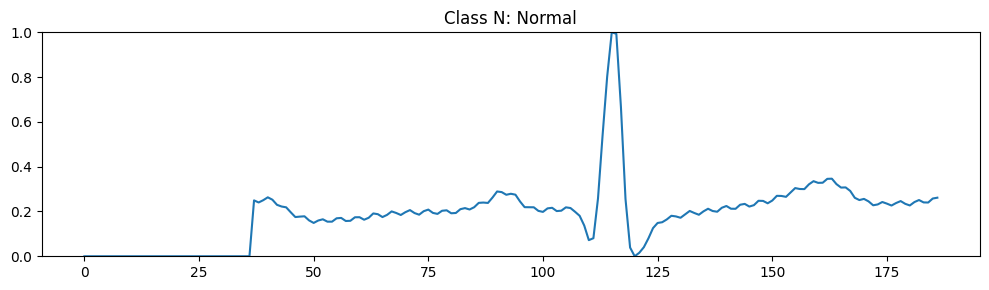

In [42]:
# Process a single ECG sample
processed_signal = preprocess_ecg_for_prediction(X[:187])  # Using first 187 points as example

# Plot to verify
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 3))
plt.plot(processed_signal)
plt.title('Class N: Normal')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()